# JSON Files to Dataset for Segmentation

## If Using "json2dataset.py"

<br />

On this case, it is impossible to transform all JSON files into theirown datasets at the same time.

In [17]:
# Example

# %run -i model/json2dataset.py "datasetのコピー/train/annotation/rwanda/スクリーンショット 2019-04-20 19.19.15.json" -o new_annotated_dataset

## Transform All JSON Files into Theirown Dataset AT THE SAME TIME

In [45]:
import base64
import glob
import json
import os
import os.path as osp

import numpy as np
import PIL.Image
import yaml

from labelme_cloned.labelme import utils
from labelme_cloned.labelme.logger import logger

In [44]:
# Get names of paths of designated files
files = glob.glob("dataset/train/annotation/rwanda/*.json")

# Create a list of the files
files_list = []
for file in files:
    files_list.append(file)

# Transform JSON files to theirown dataset
for json_file in files_list:
    # Designate a path for saving the dataset
    out_dir = osp.basename(json_file).replace('.', '_')
    out_dir = osp.join("labelme_dataset/", out_dir)
    # Make a direcrory for saving the dataset
    os.makedirs(out_dir, exist_ok=True)

    # Load a JSON file
    data = json.load(open(json_file))

    if data['imageData']:
        imageData = data['imageData']
    else:
        imagePath = os.path.join(os.path.dirname(json_file), data['imagePath'])
        with open(imagePath, 'rb') as f:
            imageData = f.read()
            imageData = base64.b64encode(imageData).decode('utf-8')
    img = utils.img_b64_to_arr(imageData)

    label_name_to_value = {'_background_': 0}
    for shape in sorted(data['shapes'], key=lambda x: x['label']):
        label_name = shape['label']
        if label_name in label_name_to_value:
            label_value = label_name_to_value[label_name]
        else:
            label_value = len(label_name_to_value)
            label_name_to_value[label_name] = label_value
    lbl = utils.shapes_to_label(img.shape, data['shapes'], label_name_to_value)

    label_names = [None] * (max(label_name_to_value.values()) + 1)
    for name, value in label_name_to_value.items():
        label_names[value] = name
    lbl_viz = utils.draw_label(lbl, img, label_names)

    PIL.Image.fromarray(img).save(osp.join(out_dir, 'img.png'))
    utils.lblsave(osp.join(out_dir, 'label.png'), lbl)
    PIL.Image.fromarray(lbl_viz).save(osp.join(out_dir, 'label_viz.png'))

    with open(osp.join(out_dir, 'label_names.txt'), 'w') as f:
        for lbl_name in label_names:
            f.write(lbl_name + '\n')

    logger.warning('info.yaml is being replaced by label_names.txt')
    info = dict(label_names=label_names)
    with open(osp.join(out_dir, 'info.yaml'), 'w') as f:
        yaml.safe_dump(info, f, default_flow_style=False)

    logger.info('Saved to: {}'.format(out_dir))

[WARNING] info.yaml is being replaced by label_names.txt (<ipython-input-44-69ed25b14e2f>:47)
[INFO] Saved to: labelme_dataset/スクリーンショット 2019-04-20 20_06_01_json (<ipython-input-44-69ed25b14e2f>:52)
[WARNING] info.yaml is being replaced by label_names.txt (<ipython-input-44-69ed25b14e2f>:47)
[INFO] Saved to: labelme_dataset/スクリーンショット 2019-04-20 19_42_59_json (<ipython-input-44-69ed25b14e2f>:52)
[WARNING] info.yaml is being replaced by label_names.txt (<ipython-input-44-69ed25b14e2f>:47)
[INFO] Saved to: labelme_dataset/スクリーンショット 2019-04-23 16_13_26_json (<ipython-input-44-69ed25b14e2f>:52)
[WARNING] info.yaml is being replaced by label_names.txt (<ipython-input-44-69ed25b14e2f>:47)
[INFO] Saved to: labelme_dataset/スクリーンショット 2019-04-20 19_36_11_json (<ipython-input-44-69ed25b14e2f>:52)
[WARNING] info.yaml is being replaced by label_names.txt (<ipython-input-44-69ed25b14e2f>:47)
[INFO] Saved to: labelme_dataset/スクリーンショット 2019-04-20 19_43_42_json (<ipython-input-44-69ed25b14e2f>:52)
[WARN

[INFO] Saved to: labelme_dataset/スクリーンショット 2019-04-20 19_49_16_json (<ipython-input-44-69ed25b14e2f>:52)
[WARNING] info.yaml is being replaced by label_names.txt (<ipython-input-44-69ed25b14e2f>:47)
[INFO] Saved to: labelme_dataset/スクリーンショット 2019-04-20 20_12_51_json (<ipython-input-44-69ed25b14e2f>:52)
[WARNING] info.yaml is being replaced by label_names.txt (<ipython-input-44-69ed25b14e2f>:47)
[INFO] Saved to: labelme_dataset/スクリーンショット 2019-04-20 19_29_50_json (<ipython-input-44-69ed25b14e2f>:52)
[WARNING] info.yaml is being replaced by label_names.txt (<ipython-input-44-69ed25b14e2f>:47)
[INFO] Saved to: labelme_dataset/スクリーンショット 2019-04-20 19_54_55_json (<ipython-input-44-69ed25b14e2f>:52)
[WARNING] info.yaml is being replaced by label_names.txt (<ipython-input-44-69ed25b14e2f>:47)
[INFO] Saved to: labelme_dataset/スクリーンショット 2019-04-20 19_55_39_json (<ipython-input-44-69ed25b14e2f>:52)
[WARNING] info.yaml is being replaced by label_names.txt (<ipython-input-44-69ed25b14e2f>:47)
[INFO

## Check

In [60]:
# Original
img = PIL.Image.open("labelme_dataset/スクリーンショット 2019-04-20 19_19_15_json/img.png")

# Mask
mask = PIL.Image.open("labelme_dataset/スクリーンショット 2019-04-20 19_19_15_json/label.png")

# Visualize the labels with the image
vis = PIL.Image.open("labelme_dataset/スクリーンショット 2019-04-20 19_19_15_json/label_viz.png")

# Label as Numpy
label = np.asarray(mask)

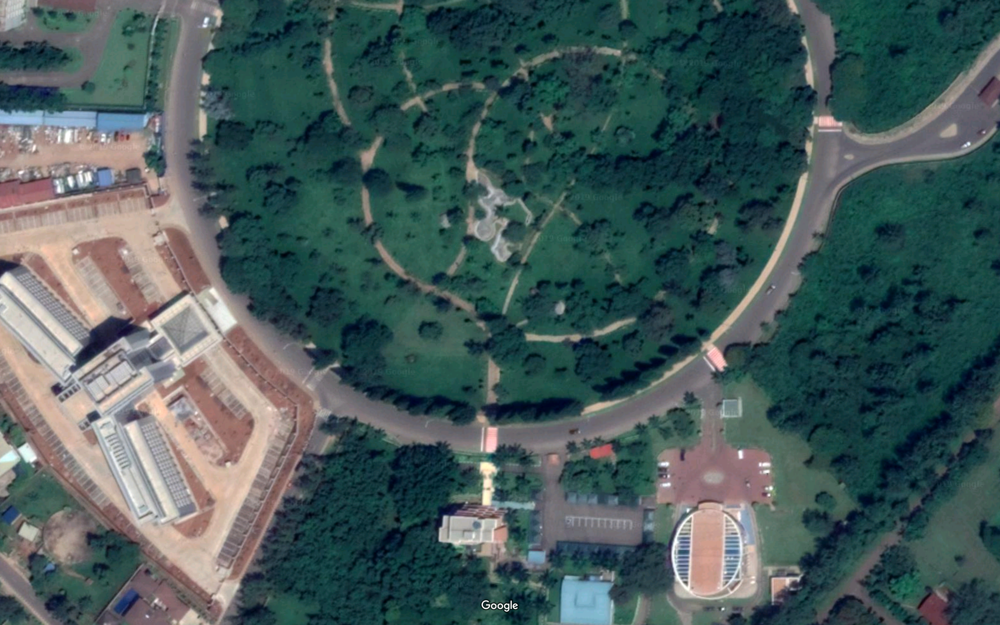

In [56]:
img

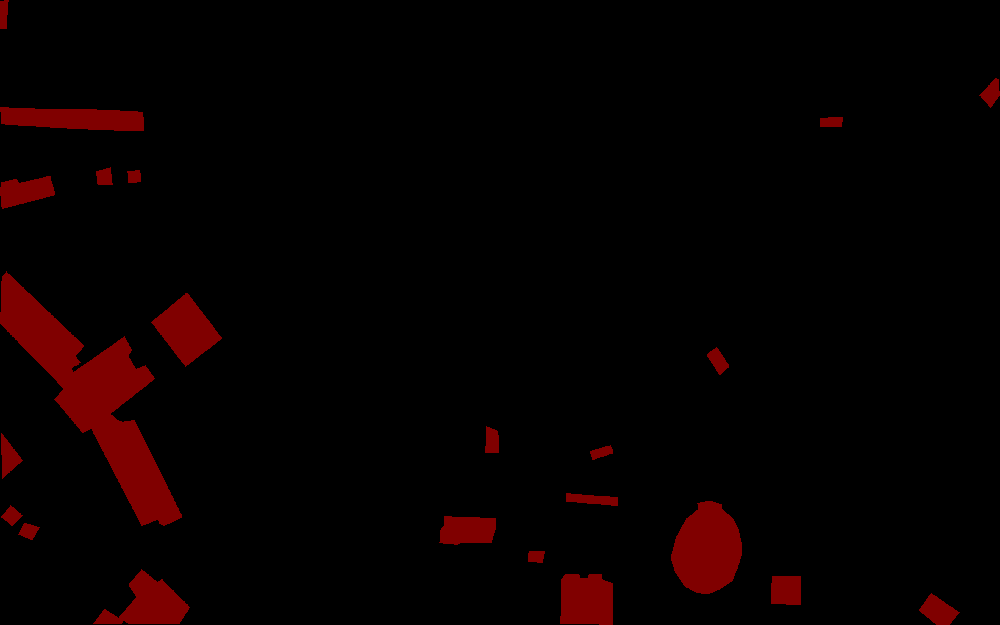

In [57]:
mask

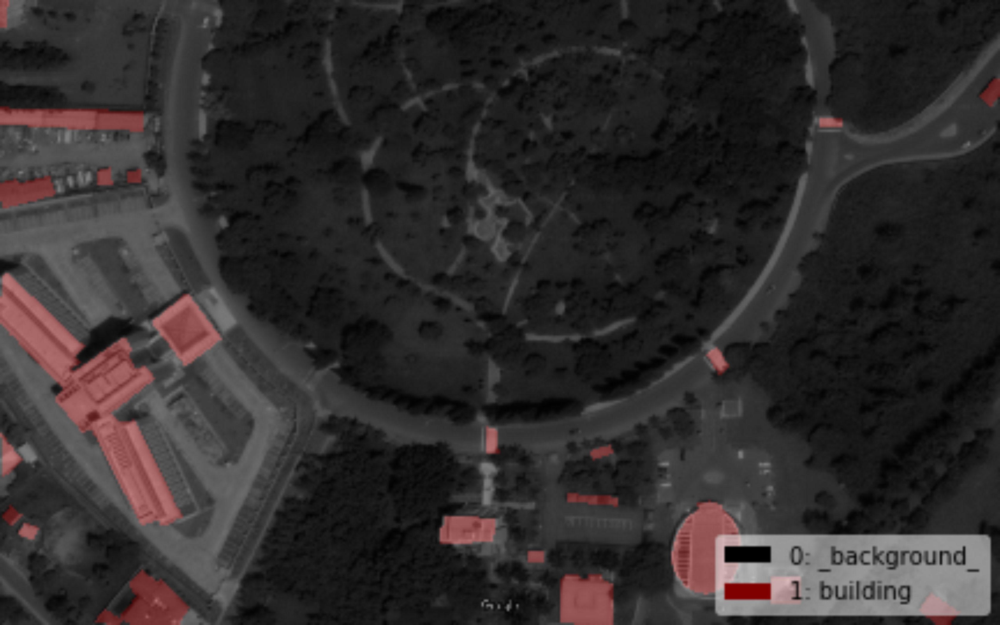

In [58]:
vis

In [61]:
label

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [1, 1, 1, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)